In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math
%matplotlib inline

In [ ]:
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1VQqAUrUEORfL22A5WvZdcTk9MCSUIZxm' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1VQqAUrUEORfL22A5WvZdcTk9MCSUIZxm" -O hw4_images.zip && rm -rf /tmp/cookies.txt

--2022-12-09 19:29:59--  https://docs.google.com/uc?export=download&confirm=&id=1VQqAUrUEORfL22A5WvZdcTk9MCSUIZxm
Resolving docs.google.com (docs.google.com)... 142.251.16.113, 142.251.16.138, 142.251.16.102, ...
Connecting to docs.google.com (docs.google.com)|142.251.16.113|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-14-8g-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/miakjl7528j0522m8slufmocpp29npf1/1670614200000/04268100670184909597/*/1VQqAUrUEORfL22A5WvZdcTk9MCSUIZxm?e=download&uuid=447f8969-ebbe-4d22-918a-7eed4171eebf [following]
--2022-12-09 19:30:00--  https://doc-14-8g-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/miakjl7528j0522m8slufmocpp29npf1/1670614200000/04268100670184909597/*/1VQqAUrUEORfL22A5WvZdcTk9MCSUIZxm?e=download&uuid=447f8969-ebbe-4d22-918a-7eed4171eebf
Resolving doc-14-8g-docs.googleusercontent.com (doc-14-8g-docs.googleusercontent.com)... 172.253.63.132, 2

In [ ]:
!unzip hw4_images.zip

Archive:  hw4_images.zip
  inflating: Baboon.bmp              
  inflating: Barbara.bmp             
  inflating: F16.bmp                 
  inflating: Lena.bmp                


In [ ]:
lena = cv2.imread('Lena.bmp')
lena = cv2.cvtColor(lena, cv2.COLOR_BGR2GRAY)

barbara = cv2.imread('Barbara.bmp')
barbara = cv2.cvtColor(barbara, cv2.COLOR_BGR2GRAY)

f16 = cv2.imread('F16.bmp')
f16 = cv2.cvtColor(f16, cv2.COLOR_BGR2GRAY)

baboon = cv2.imread('Baboon.bmp')
baboon = cv2.cvtColor(baboon, cv2.COLOR_BGR2GRAY)

In [ ]:
def show_img(*args, figsize=10, is_gray=True, title=None, fontsize=12):
    if isinstance(figsize, int):
        figsize = (figsize, figsize)
    images = args[0] if type(args[0]) is list else list(args)
    cmap=None
    if not is_gray:
        images = list(map(lambda x: cv2.cvtColor(x, cv2.COLOR_BGR2RGB), images))
    else:
        cmap = 'gray'
    plt.figure(figsize=figsize)
    for i in range(1, len(images)+1):
        plt.subplot(1, len(images), i)
        if title is not None:
            plt.title(title[i-1], fontsize=fontsize)
        
        plt.imshow(images[i-1], cmap=cmap)
        plt.axis('off')

In [ ]:
def pad(x, n, m):
    y = np.zeros((n, m))
    y[0:x.shape[0], 0:x.shape[1]] = x
    return y

In [ ]:
#------------------- 4.1.1 -------------------#

In [ ]:
def fourier_spectrum(x, n, m):
    x = pad(x, n, m)
    y = np.fft.fft2(x)
    return abs(np.fft.fftshift(y))

In [ ]:
a = 1/16 * np.array([[1, 2, 1], [2, 4, 2], [1, 2, 1]])

In [ ]:
a_1 = 1/4 * np.array([[1, 2, 1]])

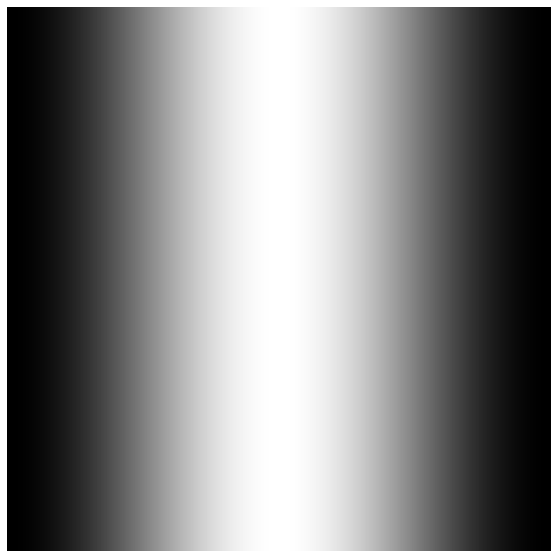

In [ ]:
show_img(fourier_spectrum(a_1, 512, 512))

In [ ]:
a_2 = 1/4 * np.array([[1], [2], [1]])

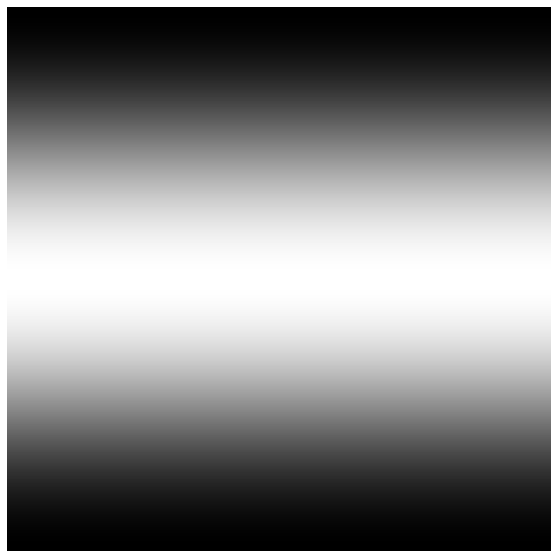

In [ ]:
show_img(fourier_spectrum(a_2, 512, 512))

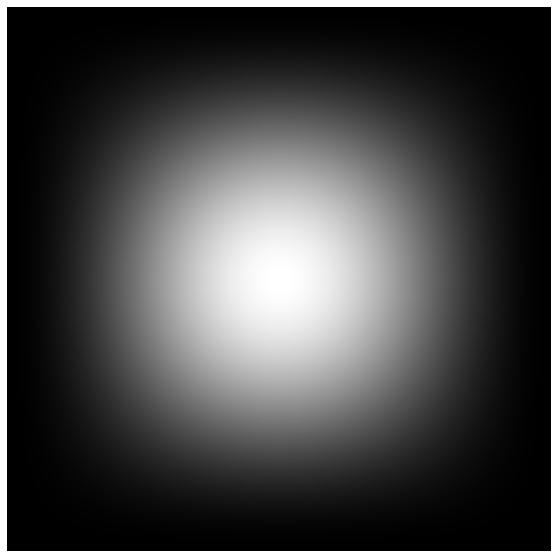

In [ ]:
show_img(fourier_spectrum(a, 512, 512))

In [ ]:
b = np.array([[-1, -1, -1], [-1, 8, -1], [-1, -1, -1]])

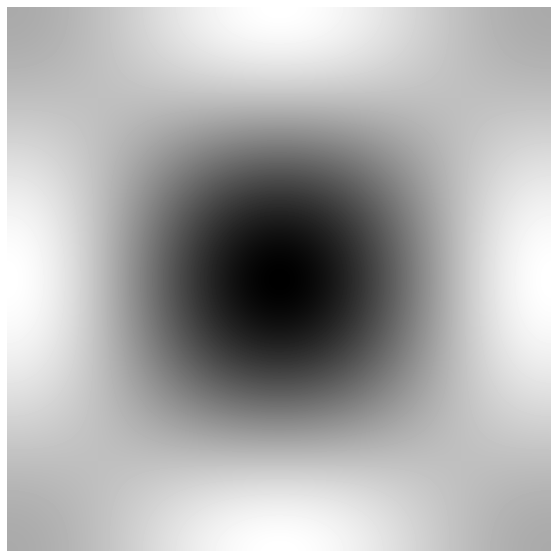

In [ ]:
show_img(fourier_spectrum(b, 512, 512))

In [ ]:
c = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])

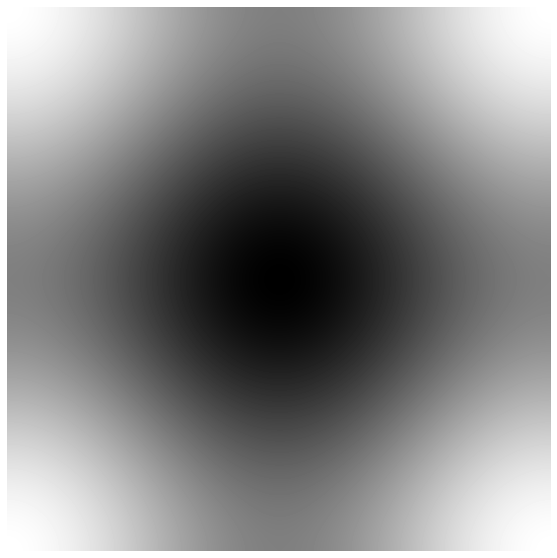

In [ ]:
show_img(fourier_spectrum(c, 512, 512))

In [ ]:
def filter(img, filter):
    x = np.fft.fft2(pad(img, img.shape[0]*2, img.shape[1]*2))
    x_shift = np.fft.fftshift(x)
    f = np.fft.fft2(pad(filter, img.shape[0]*2, img.shape[1]*2))
    f_shift = np.fft.fftshift(f)
    y = x_shift * f_shift
    y = np.fft.ifftshift(y)
    return np.fft.ifft2(y)[0:img.shape[0], 0:img.shape[1]]

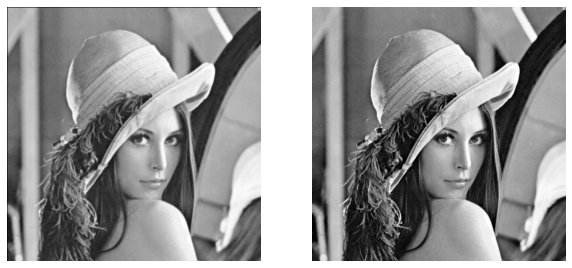

In [ ]:
f = filter(lena, a)

show_img(abs(f), lena)

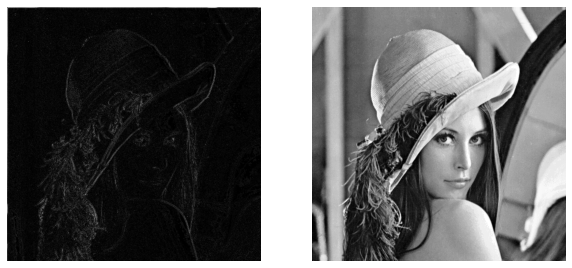

In [ ]:
f = filter(lena, b)

show_img(abs(f), lena)

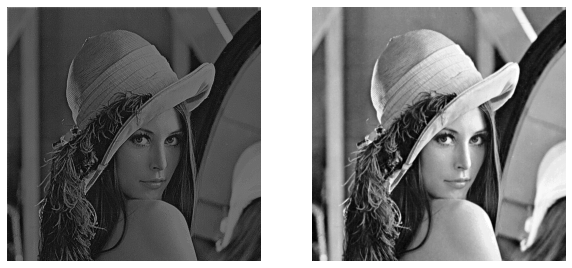

In [ ]:
f = filter(lena, c)

show_img(abs(f), lena)

In [ ]:
#------------------- 4.1.2 -------------------#

In [ ]:
def fourier_spectrum_2(x):
    y = np.fft.fft2(x)
    z = np.fft.fftshift(y)
    return abs(y), abs(z), np.log(abs(y)), np.log(abs(z))

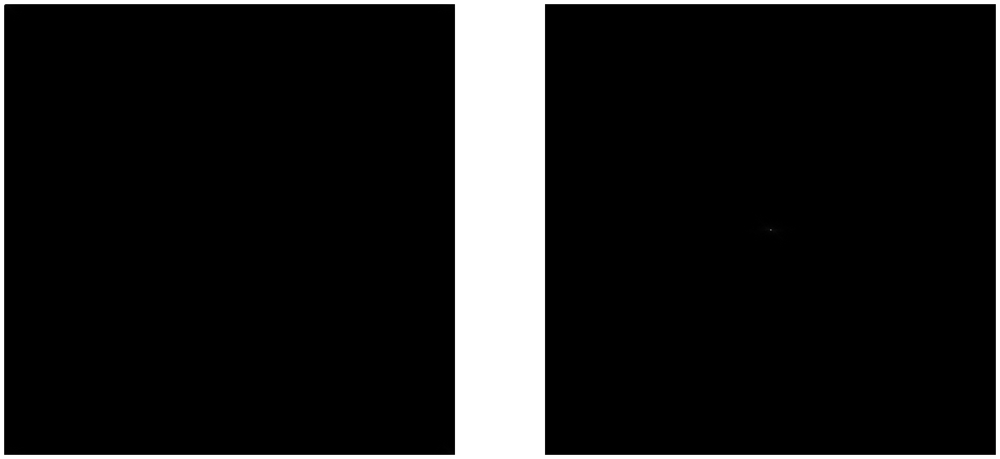

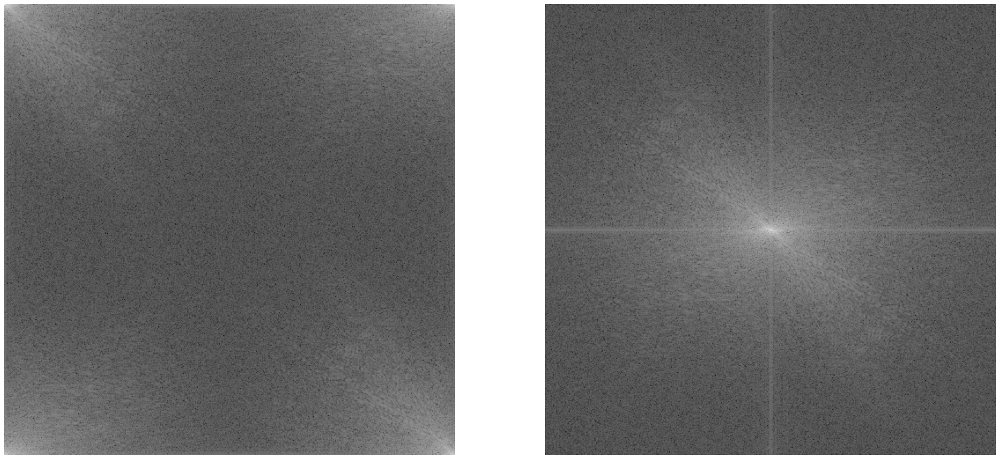

In [ ]:
i, j, k, l = fourier_spectrum_2(lena)
show_img(i, j, figsize=30)
show_img(k, l, figsize=30)

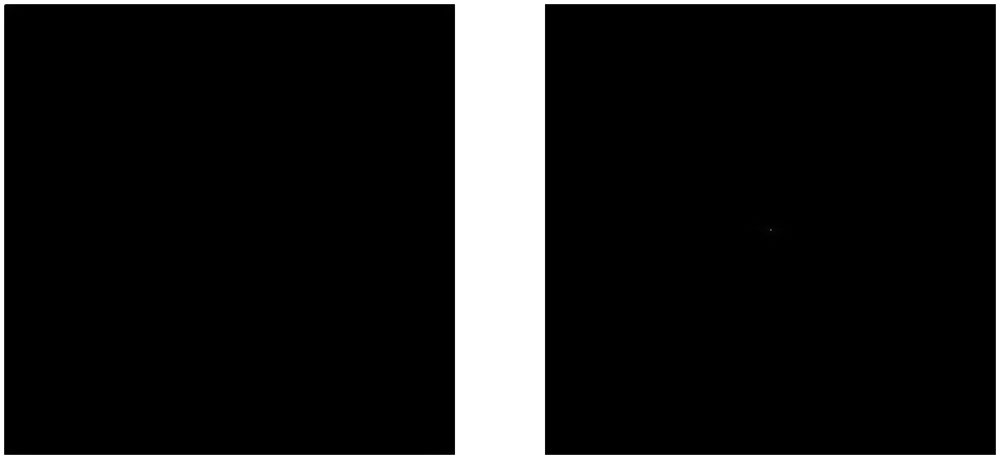

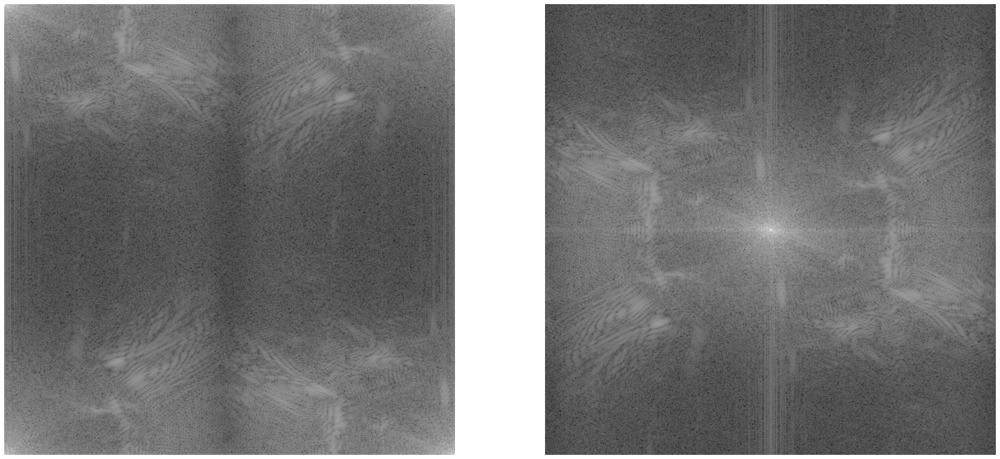

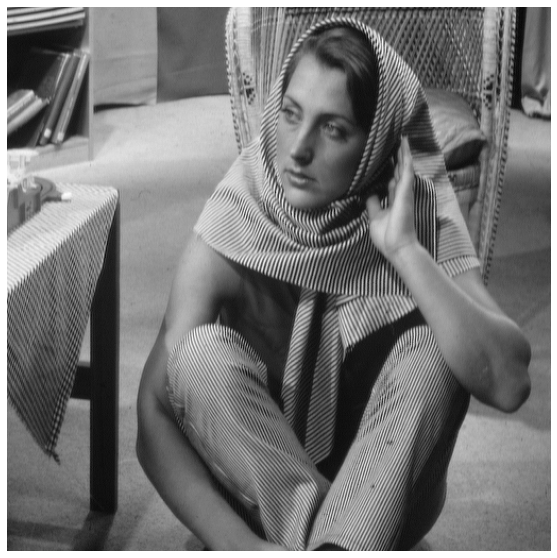

In [ ]:
i, j, k, l = fourier_spectrum_2(barbara)
show_img(i, j, figsize=30)
show_img(k, l, figsize=30)
show_img(barbara)

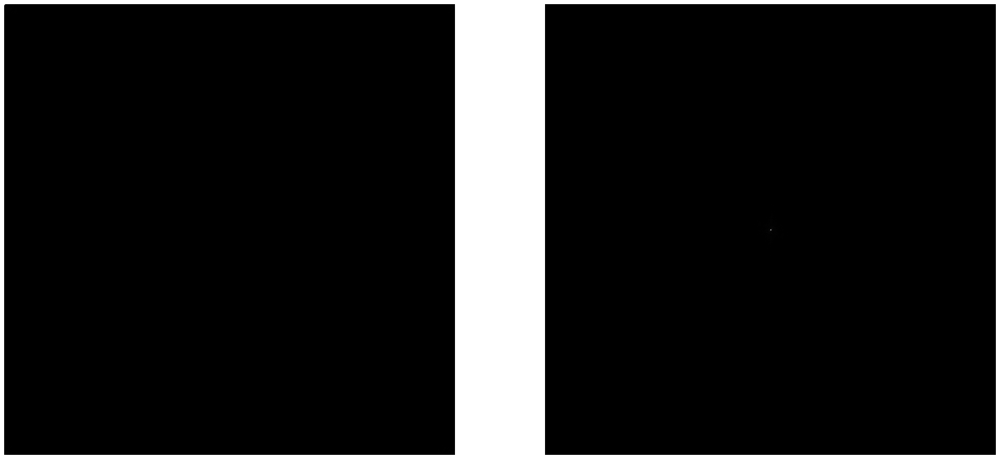

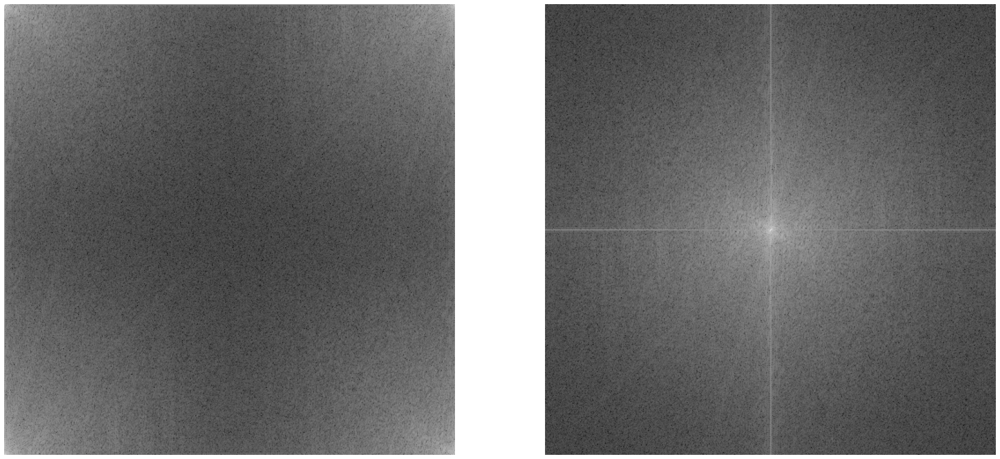

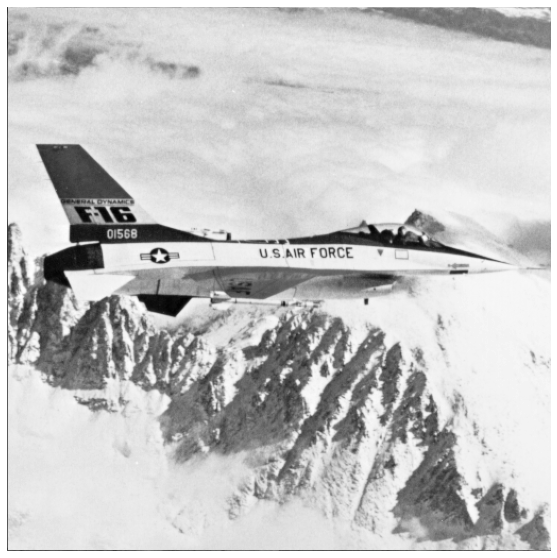

In [ ]:
i, j, k, l = fourier_spectrum_2(f16)
show_img(i, j, figsize=30)
show_img(k, l, figsize=30)
show_img(f16)

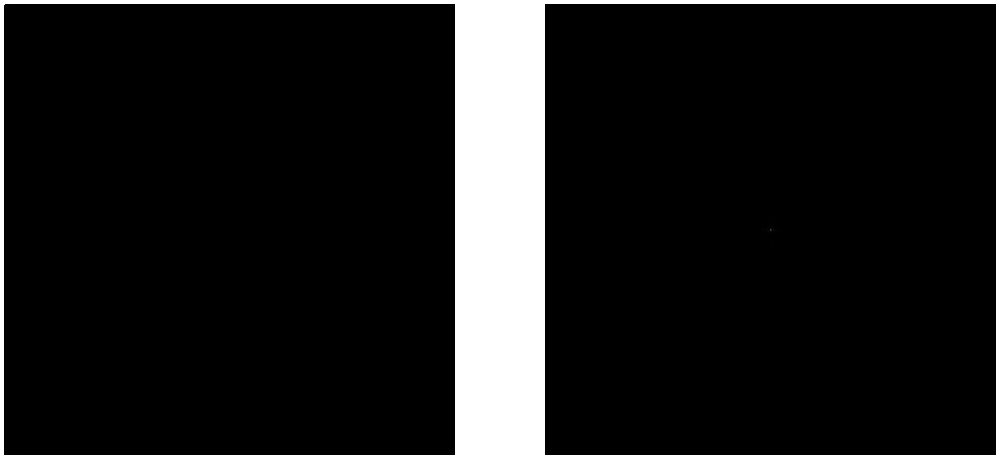

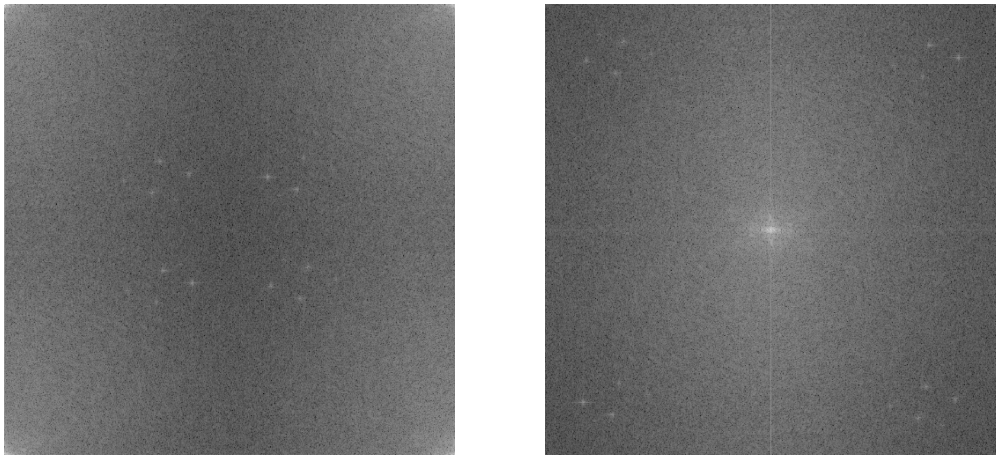

In [ ]:
i, j, k, l = fourier_spectrum_2(baboon)
show_img(i, j, figsize=30)
show_img(k, l, figsize=30)

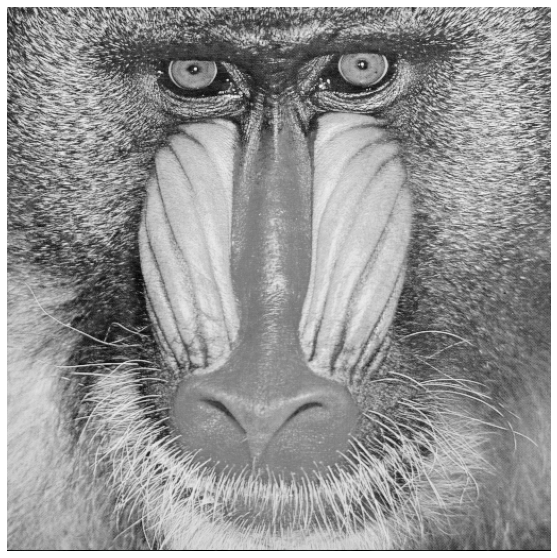

In [ ]:
show_img(baboon)

In [ ]:
#------------------- 4.2.1 -------------------#

#              Don't need to code             #

In [ ]:
#------------------- 4.2.2 -------------------#

In [ ]:
def normalize(img):
    return ((img-img.min())/(img.max() - img.min()) * 255).astype('uint8')

def filter_2(img, n=0.25, mode='a'):
    o, p = int(n*img.shape[0]), int(n*img.shape[1])
    x = np.fft.fft2(img)
    if mode == 'a':
        x[o:img.shape[0]-o, p:img.shape[1]-p] = 0
    elif mode == 'b':
        x[0:o, 0:p] = 0
        x[img.shape[0]-o:-1, 0:p] = 0
        x[0:o, img.shape[1]-p:-1] = 0
        x[img.shape[0]-o:-1, img.shape[1]-p:-1] = 0

    y = np.fft.ifft2(x)
    x_r = np.log(abs(x))
    x_r[x_r == -math.inf] = 0

    return abs(y), x_r

<ipython-input-32-0fa3537d0694>:16: RuntimeWarning: divide by zero encountered in log
  x_r = np.log(abs(x))


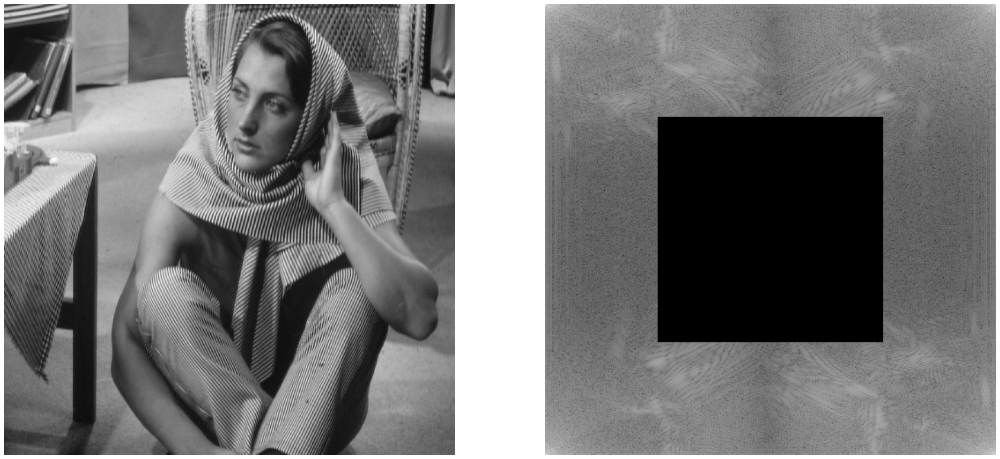

In [ ]:
r1, x1 = filter_2(barbara, 1/4, 'a')
show_img(normalize(r1), x1, figsize=30)

<ipython-input-32-0fa3537d0694>:16: RuntimeWarning: divide by zero encountered in log
  x_r = np.log(abs(x))


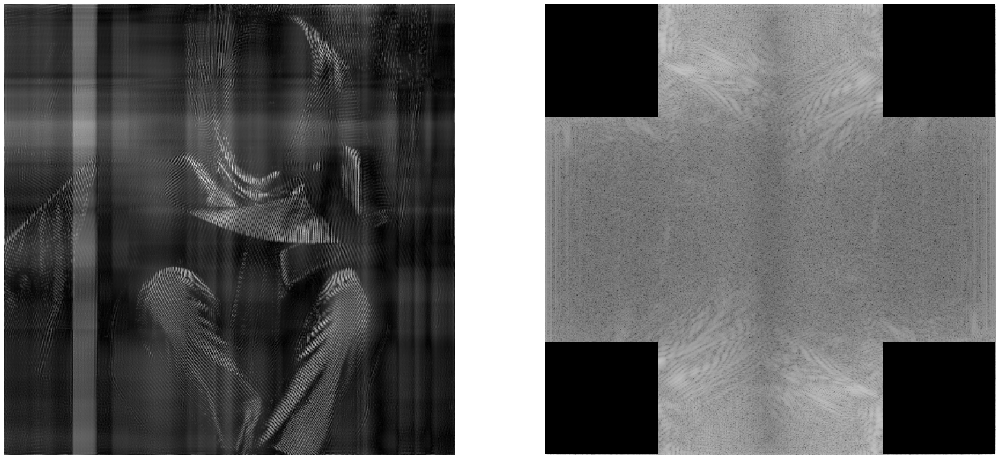

In [ ]:
r2, x2 = filter_2(barbara, 1/4, 'b')
show_img(normalize(r2), x2)

<ipython-input-32-0fa3537d0694>:16: RuntimeWarning: divide by zero encountered in log
  x_r = np.log(abs(x))


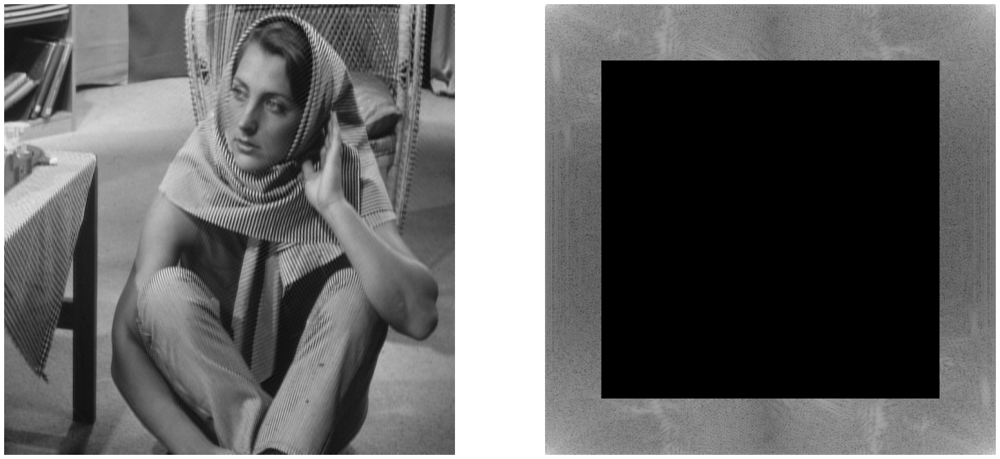

In [ ]:
r3, x3 = filter_2(barbara, 1/8, 'a')
show_img(r3, x3)

<ipython-input-32-0fa3537d0694>:16: RuntimeWarning: divide by zero encountered in log
  x_r = np.log(abs(x))


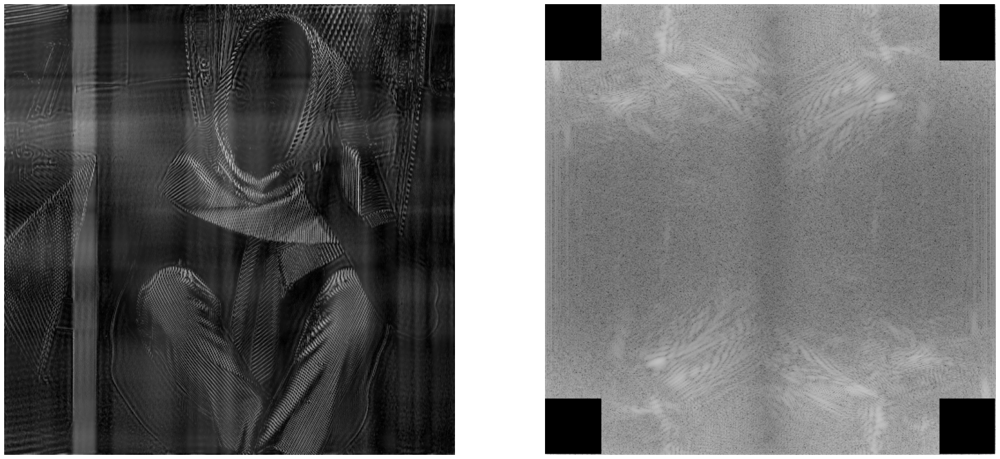

In [ ]:
r4, x4 = filter_2(barbara, 1/8, 'b')
show_img(r4, x4)